# Source Space Analysis

In [1]:
### Importing packages

# 1. Core

import io
import pickle
from copy import copy
from collections import OrderedDict
import requests
import pathlib
import glob, os
import itertools
import os.path as op

# 2. Data Science

import numpy as np
import pandas as pd
import scipy

# 3. Visualization

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from hypyp.ext.mpl3d import glm
from hypyp.ext.mpl3d.mesh import Mesh
from hypyp.ext.mpl3d.camera import Camera
from mne.viz import circular_layout
#import matplotlib
#matplotlib.use('Qt5Agg')

# 4. Brain Core

import mne
import mne_connectivity
from mne.datasets import eegbci
from mne.datasets import fetch_fsaverage
from mne.preprocessing import (ICA, corrmap)
from mne.beamformer import make_lcmv, apply_lcmv_epochs, apply_lcmv

import hypyp
from hypyp import prep 
from hypyp import analyses
from hypyp import stats
from hypyp import viz

## 1. Preparing the Epochs

In [2]:
### Defining a segmenting function for cutting original epochs into 3 sec & removing short segments with artifacts

# function to return key for any value
def get_key(val):
    for key, value in my_dict.items():
        if val == value:
            return(key)

# segmenting function
def segment_epochs(full_epochs, pair_n, subject_letter, dict_with_bad_epochs):
    if subject_letter.upper() == 'A':
        event_names = {
            'individual': 102,
            'coupled': 103,
            'actor': 106,
            'observer': 104,
            'leader':107,
            'follower':105,
            'control': 108
            }
    elif subject_letter.upper() == 'B':
        event_names = {
            'individual': 102,
            'coupled': 103,
            'actor': 104,
            'observer': 106,
            'leader':105,
            'follower':107,
            'control': 108
        }
    else:
        print('WRONG SUBJECT LETTER')
    
    conds_list = list(event_names.keys())
    final_objects_list = []
    for condition in conds_list:
        epochs_list = []
        x = 0
        k = 0 ### a time shifter to make sure all shorter epochs have the same times
        for i in range(0,8):
            full_epochs_1 = full_epochs[condition].copy()
            shorter_epochs = full_epochs_1.pick(picks=['eeg']).crop(tmin=x,tmax=x+3,include_tmax=False)
            shorter_epochs.shift_time(k, relative=True)
            epochs_list.append(shorter_epochs)
            k = -x-3
            x = x+3
        conc_object = mne.concatenate_epochs(epochs_list, add_offset=True, verbose=False) ### concatenate
        new_events = conc_object.events.copy()
        for i in range(len(conc_object)):
            new_events[i][2] = event_names[condition] 
        final_object = mne.EpochsArray(data = conc_object.get_data(), events = new_events,
                                       info = shorter_epochs.info, verbose=False, 
                                       event_id = {condition: event_names[condition]}) ### reset indices
        if condition in [conds_list[0],conds_list[1],conds_list[-1]]:
            final_object.drop(dict_with_bad_epochs[str(pair_n) + "_" + condition])
        elif condition == 'actor':
            if subject_letter.upper() == 'A':
                condition_a = 'actor'
                condition_b = 'observer'
            else:
                condition_b = 'actor'
                condition_a = 'observer'
            final_object.drop(dict_with_bad_epochs[str(pair_n) + "_" + condition_a + "-" + condition_b])
        elif condition == 'observer':
            if subject_letter.upper() == 'A':
                condition_a = 'observer'
                condition_b = 'actor'
            else:
                condition_b = 'observer'
                condition_a = 'actor'
            final_object.drop(dict_with_bad_epochs[str(pair_n) + "_" + condition_a + "-" + condition_b])
        elif condition == 'leader':
            if subject_letter.upper() == 'A':
                condition_a = 'leader'
                condition_b = 'follower'
            else:
                condition_b = 'leader'
                condition_a = 'follower'
            final_object.drop(dict_with_bad_epochs[str(pair_n) + "_" + condition_a + "-" + condition_b])
        elif condition == 'follower':
            if subject_letter.upper() == 'A':
                condition_a = 'follower'
                condition_b = 'leader'
            else:
                condition_b = 'follower'
                condition_a = 'leader'
            final_object.drop(dict_with_bad_epochs[str(pair_n) + "_" + condition_a + "-" + condition_b])
        final_objects_list.append(final_object)
    very_final_object = mne.concatenate_epochs(final_objects_list, add_offset=True, verbose=False)
    return(very_final_object)

In [3]:
### Loading dicts with bad segments 

with open('dict_with_short_bad_epochs_symmetrical.pickle', 'rb') as f:
    bad_short_epochs_sym = pickle.load(f)
    
with open('dict_with_short_bad_epochs_asymm.pickle',  'rb') as a:
    bad_short_epochs_asym = pickle.load(a)
    
bad_epochs = bad_short_epochs_sym | bad_short_epochs_asym


### Segmenting the epochs

pairs = ["003","004","005","007","008","009","010","011","012","013","014",
         "016","017","018","019","020","022","023","024","025","027"]

for pair_n in pairs:
    folder = f"/Users/aliaksandrdabranau/Data/Mirror_game/pair{pair_n}"

    epochs_a = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}a_beh_epo.fif'), verbose=False)
    epochs_b = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}b_beh_epo.fif'), verbose=False)

    epochs_a_copy = epochs_a.copy()
    epochs_a_copy.set_eeg_reference(projection=True)
    epochs_a_copy.save(pathlib.Path(folder+f'/{pair_n}a_long_epo.fif'), overwrite=True, verbose=False)
    
    epochs_b_copy = epochs_b.copy()
    epochs_b_copy.set_eeg_reference(projection=True)
    epochs_b_copy.save(pathlib.Path(folder+f'/{pair_n}b_long_epo.fif'), overwrite=True, verbose=False)

    short_epochs_a = segment_epochs(epochs_a, pair_n, "A", bad_epochs)
    short_epochs_a.set_eeg_reference(projection=True)
    short_epochs_a.save(pathlib.Path(folder+f'/{pair_n}a_short_epo.fif'), overwrite=True, verbose=False)
    
    short_epochs_b = segment_epochs(epochs_b, pair_n, "B", bad_epochs)
    short_epochs_b.set_eeg_reference(projection=True)
    short_epochs_b.save(pathlib.Path(folder+f'/{pair_n}b_short_epo.fif'), overwrite=True, verbose=False)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Dropped 3 epochs: 14, 77, 93
Dropped 1 epoch: 13
Dropped 0 epochs: 
Dropped 0 epochs: 
Dropped 1 epoch: 14
Dropped 0 epochs: 
Dropped 12 epochs: 3, 7, 11, 23, 27, 29, 39, 43, 44, 45, 55, 71
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Dropped 3 epochs: 14, 77, 93
Dropped 1 epoch: 13
Dropped 0 epochs: 
Dropped 0 epochs: 
Dropped 0 epochs: 
Dropped 1 epoch: 14
Droppe

Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Dropped 5 epochs: 3, 4, 21, 67, 118
Dropped 1 epoch: 26
Dropped 1 epoch: 19
Dropped 2 epochs: 2, 3
Dropped 0 epochs: 
Dropped 0 epochs: 
Dropped 2 epochs: 5, 63
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Dropped 5 epochs: 3, 4, 21, 67, 118
Dropped 1 epoch: 26
Dropped 2 epochs: 2, 3
Dropped 1 epoch: 19
Dropped 0 epochs: 
Dropped 0 epochs: 
Dropped 2 epochs: 5, 63
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
EEG channel type selected for re-referencing


Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Dropped 6 epochs: 21, 23, 75, 79, 112, 118
Dropped 8 epochs: 10, 21, 26, 29, 45, 55, 65, 124
Dropped 5 epochs: 10, 13, 23, 27, 33
Dropped 1 epoch: 26
Dropped 1 epoch: 5
Dropped 5 epochs: 43, 48, 50, 56, 59
Dropped 0 epochs: 
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference project

1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Dropped 3 epochs: 39, 47, 49
Dropped 3 epochs: 10, 21, 54
Dropped 1 epoch: 0
Dropped 2 epochs: 9, 14
Dropped 0 epochs: 
Dropped 2 epochs: 2, 7
Dropped 0 epochs: 
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Dropped 3 epochs: 39, 47, 49
Dropped 3 epochs: 10, 21, 54
Dropped 2 epochs: 9, 14
Dropped 1 epoch: 0
Dropped 2 epochs: 2, 7
Dropped 0 epochs: 
Dropped 0 epochs: 
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
EEG channel type selected for re-referencing
Adding average EEG reference projection

## 2. Source Localization & Connectivity Estimation

In [ ]:
### Creating the forward model

#src_new = mne.setup_volume_source_space(subject = 'fsaverage', pos = 5.0, bem = bem)
#src_new.save('source_space_volume_new_src.fif')
#src = 'source_space_volume_new_src.fif'
#fwd = mne.make_forward_solution(short_epochs_a.info, trans=trans_new, src=src,
                                #bem=bem, eeg=True, meg = False, mindist=5.0, n_jobs=None)
#mne.write_forward_solution("eeg_new_fwd.fif", fwd, overwrite=True, verbose=None)

In [2]:
### Loading pre-computed and/or standard files

# Download fsaverage files
folder1 = f"/Users/aliaksandrdabranau/Data/Mirror_game/"
fs_dir = fetch_fsaverage(verbose=True)
subjects_dir = op.dirname(fs_dir)

# The files live in:
subject = 'fsaverage'
trans = 'fsaverage'  # MNE has a built-in fsaverage transformation
trans_new = 'sample_new2-trans.fif' # But I adjusted electrode positions a bit
bem = op.join(fs_dir, 'bem', 'fsaverage-5120-5120-5120-bem-sol.fif')

# Reading forward solution
fwd_fname = 'eeg_new_fwd.fif'
forward = mne.read_forward_solution(folder1+fwd_fname)
src = forward['src']

0 files missing from root.txt in /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data
0 files missing from bem.txt in /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage
Reading forward solution from /Users/aliaksandrdabranau/Data/Mirror_game/eeg_new_fwd.fif...
    Reading a source space...
    [done]
    1 source spaces read
    Desired named matrix (kind = 3523) not available
    Read EEG forward solution (14629 sources, 64 channels, free orientations)
    Source spaces transformed to the forward solution coordinate frame


In [5]:
### Computing spatial filters for every participant

filters_dict = {}

pairs = ["003","004","005","007","008","009","010","011","012","013","014",
         "016","017","018","019","020","022","023","024","025","027"]

for pair_n in pairs:
    folder = f"/Users/aliaksandrdabranau/Data/Mirror_game/pair{pair_n}"
    
    short_epochs_a = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}a_short_epo.fif'), verbose=False)
    long_epochs_a = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}a_long_epo.fif'), verbose=False)
    
    short_epochs_b = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}b_short_epo.fif'), verbose=False)
    long_epochs_b = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}b_long_epo.fif'), verbose=False)

    # Computing the covariance matrices

    data_cov_a = mne.compute_covariance(short_epochs_a, tmin=0.1, tmax=2.99,
                                      method='empirical')
    noise_cov_a = mne.compute_covariance(long_epochs_a, tmin=-2, tmax=0,
                                      method='empirical')

    data_cov_b = mne.compute_covariance(short_epochs_b, tmin=0.1, tmax=2.99,
                                      method='empirical')
    noise_cov_b = mne.compute_covariance(long_epochs_b, tmin=-2, tmax=0,
                                      method='empirical')

    # Computing the spatial filters & saving

    filters_a = make_lcmv(short_epochs_a.info, forward, data_cov_a, reg=0.05,
                        noise_cov=noise_cov_a, pick_ori='max-power',
                        weight_norm='unit-noise-gain', rank=None)
    filters_a.save(pathlib.Path(folder+f'/{pair_n}_filters_a-lcmv.h5'), overwrite = True)

    filters_b = make_lcmv(short_epochs_b.info, forward, data_cov_b, reg=0.05,
                        noise_cov=noise_cov_b, pick_ori='max-power',
                        weight_norm='unit-noise-gain', rank=None)
    filters_b.save(pathlib.Path(folder+f'/{pair_n}_filters_b-lcmv.h5'), overwrite = True)

Computing rank from data with rank=None
    Using tolerance 1.8e-10 (2.2e-16 eps * 63 dim * 1.3e+04  max singular value)
    Estimated rank (eeg): 62
    EEG: rank 62 computed from 63 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 63 -> 62
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 425500
[done]
Computing rank from data with rank=None
    Using tolerance 5.9e-11 (2.2e-16 eps * 63 dim * 4.2e+03  max singular value)
    Estimated rank (eeg): 62
    EEG: rank 62 computed from 63 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 63 -> 62
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 38988
[done]
Computing rank from data with rank=None
    Using tolerance 3e-10 (2.2e-16 eps * 62 dim * 2.2e+04  max singular value)
  

    Estimated rank (eeg): 63
    EEG: rank 63 computed from 64 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 64 -> 63
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 445480
[done]
Computing rank from data with rank=None
    Using tolerance 5.6e-11 (2.2e-16 eps * 64 dim * 4e+03  max singular value)
    Estimated rank (eeg): 63
    EEG: rank 63 computed from 64 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 64 -> 63
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 40527
[done]
Computing rank from covariance with rank=None
    Using tolerance 4.7e-14 (2.2e-16 eps * 64 dim * 3.3  max singular value)
    Estimated rank (eeg): 63
    EEG: rank 63 computed from 64 data channels with 1 projector
Computing rank from covaria

Computing rank from covariance with rank=None
    Using tolerance 2e-13 (2.2e-16 eps * 64 dim * 14  max singular value)
    Estimated rank (eeg): 60
    EEG: rank 60 computed from 64 data channels with 1 projector
Making LCMV beamformer with rank {'eeg': 60}
Computing inverse operator with 64 channels.
    64 out of 64 channels remain after picking
Selected 64 channels
Whitening the forward solution.
    Created an SSP operator (subspace dimension = 1)
Computing rank from covariance with rank={'eeg': 60}
    Setting small EEG eigenvalues to zero (without PCA)
Creating the source covariance matrix
Adjusting source covariance matrix.
Computing beamformer filters for 14629 sources
Filter computation complete
Computing rank from covariance with rank=None
    Using tolerance 6.6e-14 (2.2e-16 eps * 64 dim * 4.6  max singular value)
    Estimated rank (eeg): 60
    EEG: rank 60 computed from 64 data channels with 1 projector
Computing rank from covariance with rank=None
    Using tolerance 7.

    Using tolerance 8.5e-14 (2.2e-16 eps * 62 dim * 6.1  max singular value)
    Estimated rank (eeg): 53
    EEG: rank 53 computed from 62 data channels with 1 projector
Making LCMV beamformer with rank {'eeg': 53}
Computing inverse operator with 62 channels.
    62 out of 64 channels remain after picking
Selected 62 channels
Whitening the forward solution.
    Created an SSP operator (subspace dimension = 1)
Computing rank from covariance with rank={'eeg': 53}
    Setting small EEG eigenvalues to zero (without PCA)
Creating the source covariance matrix
Adjusting source covariance matrix.
Computing beamformer filters for 14629 sources
Filter computation complete
Computing rank from data with rank=None
    Using tolerance 3.1e-10 (2.2e-16 eps * 64 dim * 2.2e+04  max singular value)
    Estimated rank (eeg): 63
    EEG: rank 63 computed from 64 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Redu

    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 63 -> 62
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 428460
[done]
Computing rank from data with rank=None
    Using tolerance 6.3e-11 (2.2e-16 eps * 63 dim * 4.5e+03  max singular value)
    Estimated rank (eeg): 62
    EEG: rank 62 computed from 63 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 63 -> 62
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 38988
[done]
Computing rank from data with rank=None
    Using tolerance 2.4e-10 (2.2e-16 eps * 64 dim * 1.7e+04  max singular value)
    Estimated rank (eeg): 63
    EEG: rank 63 computed from 64 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 64 -> 63
Estimating covariance using EMPI

Estimating covariance using EMPIRICAL
Done.
Number of samples used : 423280
[done]
Computing rank from data with rank=None
    Using tolerance 8.5e-11 (2.2e-16 eps * 63 dim * 6.1e+03  max singular value)
    Estimated rank (eeg): 62
    EEG: rank 62 computed from 63 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 63 -> 62
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 38475
[done]
Computing rank from covariance with rank=None
    Using tolerance 1.1e-13 (2.2e-16 eps * 62 dim * 8  max singular value)
    Estimated rank (eeg): 59
    EEG: rank 59 computed from 62 data channels with 1 projector
Computing rank from covariance with rank=None
    Using tolerance 1.3e-13 (2.2e-16 eps * 62 dim * 9.3  max singular value)
    Estimated rank (eeg): 59
    EEG: rank 59 computed from 62 data channels with 1 projector
Making LCMV beamformer with rank {'eeg': 59}
C

Making LCMV beamformer with rank {'eeg': 54}
Computing inverse operator with 63 channels.
    63 out of 64 channels remain after picking
Selected 63 channels
Whitening the forward solution.
    Created an SSP operator (subspace dimension = 1)
Computing rank from covariance with rank={'eeg': 54}
    Setting small EEG eigenvalues to zero (without PCA)
Creating the source covariance matrix
Adjusting source covariance matrix.
Computing beamformer filters for 14629 sources
Filter computation complete
Computing rank from covariance with rank=None
    Using tolerance 2.6e-14 (2.2e-16 eps * 62 dim * 1.9  max singular value)
    Estimated rank (eeg): 57
    EEG: rank 57 computed from 62 data channels with 1 projector
Computing rank from covariance with rank=None
    Using tolerance 4.2e-14 (2.2e-16 eps * 62 dim * 3  max singular value)
    Estimated rank (eeg): 57
    EEG: rank 57 computed from 62 data channels with 1 projector
Making LCMV beamformer with rank {'eeg': 57}
Computing inverse oper

Computing inverse operator with 64 channels.
    64 out of 64 channels remain after picking
Selected 64 channels
Whitening the forward solution.
    Created an SSP operator (subspace dimension = 1)
Computing rank from covariance with rank={'eeg': 60}
    Setting small EEG eigenvalues to zero (without PCA)
Creating the source covariance matrix
Adjusting source covariance matrix.
Computing beamformer filters for 14629 sources
Filter computation complete
Computing rank from data with rank=None
    Using tolerance 2.3e-10 (2.2e-16 eps * 64 dim * 1.6e+04  max singular value)
    Estimated rank (eeg): 63
    EEG: rank 63 computed from 64 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 64 -> 63
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 448440
[done]
Computing rank from data with rank=None
    Using tolerance 7.5e-11 (2.2e-16 eps * 64 dim * 5.3e+03  max

    Estimated rank (eeg): 62
    EEG: rank 62 computed from 63 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 63 -> 62
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 41040
[done]
Computing rank from data with rank=None
    Using tolerance 2.1e-10 (2.2e-16 eps * 62 dim * 1.5e+04  max singular value)
    Estimated rank (eeg): 61
    EEG: rank 61 computed from 62 data channels with 1 projector
    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 62 -> 61
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 444000
[done]
Computing rank from data with rank=None
    Using tolerance 7.3e-11 (2.2e-16 eps * 62 dim * 5.3e+03  max singular value)
    Estimated rank (eeg): 61
    EEG: rank 61 computed from 62 data channels with 1 projector
    Created an SSP operator

    Created an SSP operator (subspace dimension = 1)
    Setting small EEG eigenvalues to zero (without PCA)
Reducing data rank from 64 -> 63
Estimating covariance using EMPIRICAL
Done.
Number of samples used : 37449
[done]
Computing rank from covariance with rank=None
    Using tolerance 8.7e-14 (2.2e-16 eps * 64 dim * 6.1  max singular value)
    Estimated rank (eeg): 59
    EEG: rank 59 computed from 64 data channels with 1 projector
Computing rank from covariance with rank=None
    Using tolerance 1.1e-13 (2.2e-16 eps * 64 dim * 7.5  max singular value)
    Estimated rank (eeg): 59
    EEG: rank 59 computed from 64 data channels with 1 projector
Making LCMV beamformer with rank {'eeg': 59}
Computing inverse operator with 64 channels.
    64 out of 64 channels remain after picking
Selected 64 channels
Whitening the forward solution.
    Created an SSP operator (subspace dimension = 1)
Computing rank from covariance with rank={'eeg': 59}
    Setting small EEG eigenvalues to zero (wit

In [8]:
### Applying the spatial filters to every participant to symmetric condition 
### & extracting label time courses
### & calculating PLV
    
# Defining variables

sym_conditions_list = ['individual','coupled','control']

pairs = ["003","004","005","007","008","009","010","011","012","013","014",
         "016","017","018","019","020","022","023","024","025","027"]


mne.datasets.fetch_hcp_mmp_parcellation(subjects_dir=subjects_dir,
                                        verbose=True)

mne.datasets.fetch_aparc_sub_parcellation(subjects_dir=subjects_dir,
                                          verbose=True)

atlas_path = "/Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage/mri/aparc.a2009s+aseg.mgz"

con_result_dict = {}

In [4]:
# Running...

for pair_n in pairs:
    print(pair_n)
    
    folder = f"/Users/aliaksandrdabranau/Data/Mirror_game/pair{pair_n}"
    
    short_epochs_a = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}a_short_epo.fif'), verbose=False)
    short_epochs_b = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}b_short_epo.fif'), verbose=False)
    
    filter_a = mne.beamformer.read_beamformer(pathlib.Path(folder+f'/{pair_n}_filters_a-lcmv.h5'))
    filter_b = mne.beamformer.read_beamformer(pathlib.Path(folder+f'/{pair_n}_filters_b-lcmv.h5'))
    
    for condition in sym_conditions_list:
        print(condition)
        
        # Extracting label time courses
        stc_a = apply_lcmv_epochs(short_epochs_a[condition], filter_a, verbose=False)
        label_ts_a = mne.extract_label_time_course(
                stc_a, atlas_path, src, mode='mean', return_generator=False, verbose=False)
        label_ts_a_np = np.stack(label_ts_a, axis=0)
        
        
        stc_b = apply_lcmv_epochs(short_epochs_b[condition], filter_b, verbose=False)
        label_ts_b = mne.extract_label_time_course(
            stc_b, atlas_path, src, mode='mean', return_generator=False, verbose=False)
        label_ts_b_np = np.stack(label_ts_b, axis=0)

        
        # Combining the data of the two subjects into one array
        data_inter = np.asarray([label_ts_a_np,label_ts_b_np],dtype=float)

        # Calculating the complex signal with Hilbert
        freq_bands = {'Theta':[4,7.5],
                      'Alpha_Combined': [8,13],
                      'Beta':[14,30]}
        
        sampling_rate = 256
        
        complex_signal = analyses.compute_freq_bands(data_inter, sampling_rate, freq_bands)
        
        # Calculating synchrony value (PLV)
        con = analyses.compute_sync(complex_signal, mode = 'plv', epochs_average=True)
        
        con_result_dict[pair_n + "_" + condition] = con
        
        # Saving the dictionary
        with open(pathlib.Path('con_result_dict.pickle'), 
                  'wb') as handle:
            pickle.dump(con_result_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

003
individual
coupled
control
004
individual
coupled
control
005
individual
coupled
control
007
individual
coupled
control
008
individual
coupled
control
009
individual
coupled
control
010
individual
coupled
control
011
individual
coupled
control
012
individual
coupled
control
013
individual
coupled
control
014
individual
coupled
control
016
individual
coupled
control
017
individual
coupled
control
018
individual
coupled
control
019
individual
coupled
control
020
individual
coupled
control
022
individual
coupled
control
023
individual
coupled
control
024
individual
coupled
control
025
individual
coupled
control
027
individual
coupled
control


## 3. Permutation Tests

In [8]:
def perm_test(group1,group2):
    
    result = stats.statscluster(
    
        data=[group1, group2],
              test = 'rel ttest',      # repeated-samples t-test 
              factor_level = None,     # this is for ANOVA
              ch_con_freq=None,        # a priori connectivity
              tail=0,                  # both sides of the distribution
              n_permutations=5000,
              alpha=2.086              # corresponds to two-tails' 0.05 significance level 
                                       # with 20 degress of freedom (21 pair - 1)
                        )
    return(result)


def custom_permutation_test(dict_with_matrices,freq,cond_a,cond_b):
    if freq == 'theta':
        freq_num = 0
    elif freq == 'alpha_combined':
        freq_num = 1
    elif freq == 'beta':
        freq_num = 2
    n_ch = 192
    group1 = np.array([y[freq_num, 0:n_ch, n_ch:2*n_ch] for (x,y) in dict_with_matrices.items() if f'_{cond_a}' in x])
    group2 = np.array([b[freq_num, 0:n_ch, n_ch:2*n_ch] for (a,b) in dict_with_matrices.items() if f'_{cond_b}' in a])
    
    result = perm_test(group1,group2)
    
    return(np.array(result,dtype=object))

In [34]:
source_res_perm = {}

freq_list = ['theta','alpha_combined','beta']


for freq in freq_list:
        
    ### 1. Symmetric conditions
    source_res_perm[f'{freq}_coupled_vs_control'] = custom_permutation_test(con_result_dict,
                                                                                   freq,
                                                                                   'coupled','control')
    source_res_perm[f'{freq}_coupled_vs_individual'] = custom_permutation_test(con_result_dict,
                                                                                      freq,
                                                                                      'coupled','individual')
    source_res_perm[f'{freq}_control_vs_individual'] = custom_permutation_test(con_result_dict,
                                                                                      freq,
                                                                                      'control','individual')

stat_fun(H1): min=-4.611713 max=5.688368
Running initial clustering …
Found 1384 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.959205 max=4.119330
Running initial clustering …
Found 1522 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.838579 max=5.254953
Running initial clustering …
Found 1097 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.033931 max=4.877619
Running initial clustering …
Found 1131 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.202549 max=5.099453
Running initial clustering …
Found 1248 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.320071 max=5.147419
Running initial clustering …
Found 1096 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-5.871211 max=4.999876
Running initial clustering …
Found 1515 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-7.320569 max=3.639553
Running initial clustering …
Found 2257 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-5.471354 max=4.350292
Running initial clustering …
Found 1292 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

<b>Although the immediate output above shows that the number of permutations is 0, the saved data is correct.<br>These zeros appear after reloading the script.</b>

In [136]:
# Saving the dictionary
#with open(pathlib.Path('source_res_perm_sym.pickle'),'wb') as handle:
    #pickle.dump(source_res_perm, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [4]:
# Opening the dictionary
with open('source_res_perm_sym.pickle',  'rb') as a:
        source_res_perm = pickle.load(a)

In [15]:
### Defining functions for data presentations

def freq_fun(string):
    ff = ['theta','beta','alpha_combined']
    for f in ff:
        if f in string:
            result = f
    return(result)

def cond_fun(string):
    new_string = string.split('_vs_')
    cc = ['coupled','control','individual','following','observation']
    for c in cc:
        if c in new_string[0]:
            cond1 = c
        if c in new_string[1]:
            cond2 = c
    return(cond1,cond2)

def clear_data_frame(results_dict):
    key_list = []
    n_list = []
    index_list = []
    sign_list = []
    
    ref_list = []
    freq_list = []
    cond1_list = []
    cond2_list = []

    dict_for_plots_plv = {}

    for key in results_dict.keys():
    
        clusters = results_dict[key][1]
        cluster_p_values = results_dict[key][2]
        Stat_obs = results_dict[key][0]
    
        n_significant_clusters = len([i for i in cluster_p_values if i<0.05])
        if n_significant_clusters > 0:
            freq_list.append(freq_fun(key))
            cond1_list.append(cond_fun(key)[0])
            cond2_list.append(cond_fun(key)[1])
        
            cluster_indices = [list(cluster_p_values).index(i) for i in cluster_p_values if i<0.05]
            key_list.append(key)
            n_list.append(n_significant_clusters)
            index_list.append(cluster_indices)
        
            sign_sublist = []
            for cluster_p in cluster_p_values:
                if cluster_p <= 0.05:
                    sensors_plot = clusters[np.where(cluster_p_values == cluster_p)[0][0]].astype('uint8')
                    Stat_values = sensors_plot*Stat_obs
                    dict_for_plots_plv[key] = Stat_values
                
                    cluster_values = []
                    for e_out in range(0,192):
                        for e_in in range(0,192):
                            if Stat_values[e_out][e_in] != 0:
                                cluster_values.append(Stat_values[e_out][e_in])
            
                    if sum(np.sign(cluster_values)) != len(np.sign(cluster_values)):
                        sign_sublist.append('negative')
                    else:
                        sign_sublist.append('positive')
            sign_list.append(sign_sublist)
                
    cluster_data_df = pd.DataFrame({
        'Key':key_list,
        
        'Condition_1': cond1_list,
        'Condition_2': cond2_list,
        'Frequency': freq_list,
        'N_signif._clusters': n_list,
        'Signs': sign_list,
        'Indices': index_list
    })
    
    return(cluster_data_df,dict_for_plots_plv)

In [6]:
sym_results = clear_data_frame(source_res_perm)
sym_results[0]

,Key,Condition_1,Condition_2,Frequency,N_signif._clusters,Signs,Indices
0,beta_coupled_vs_control,coupled,control,beta,2,"[negative, negative]","[400, 425]"
1,beta_coupled_vs_individual,coupled,individual,beta,7,"[negative, negative, negative, negative, negat...","[196, 332, 335, 1548, 1551, 1761, 1948]"


In [60]:
### Retrieving labels

xxx = sym_results[1]['beta_coupled_vs_individual']
yyy = np.zeros((192,192), dtype = float)
targets = []
for i in range(0,192):
    if False in [k for k in xxx[i] == yyy[i]]:
        targets.append(i)

links = []
for target in targets:
    for i in range(0,192):
        if xxx[target][i] not in [0.0,-0.0]:
            links.append((target,i))
            
brain_a = np.unique([i[0] for i in links])
brain_b = np.unique([i[1] for i in links])

lables = mne.get_volume_labels_from_aseg(atlas_path)

labels_brain_a = [lables[i] for i in brain_a]
labels_brain_b = [lables[i] for i in brain_b]

In [14]:
### Combining labels' data for each brain

pair_n = '003'
condition = 'coupled'
    
folder = f"/Users/aliaksandrdabranau/Data/Mirror_game/pair{pair_n}"
    
short_epochs_a = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}a_short_epo.fif'), verbose=False)
short_epochs_b = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}b_short_epo.fif'), verbose=False)
    
filter_a = mne.beamformer.read_beamformer(pathlib.Path(folder+f'/{pair_n}_filters_a-lcmv.h5'))
filter_b = mne.beamformer.read_beamformer(pathlib.Path(folder+f'/{pair_n}_filters_b-lcmv.h5'))
        
# Extracting voxel time courses
stc_a = apply_lcmv_epochs(short_epochs_a[condition], filter_a, verbose=False)
        
stc_b = apply_lcmv_epochs(short_epochs_b[condition], filter_b, verbose=False)

In [61]:
# Extracting target labels

labels_data_brain_a = []
for name in labels_brain_a:
    just_one_label = stc_a[0].in_label(label = name, mri = atlas_path, src = src)
    labels_data_brain_a.append(just_one_label)
    
labels_data_brain_b = []
for name_b in labels_brain_b:
    just_one_label_b = stc_b[0].in_label(label = name_b, mri = atlas_path, src = src)
    labels_data_brain_b.append(just_one_label_b)


data_brain_a = np.concatenate(([i.to_data_frame().iloc[:,2:].to_numpy() for i in labels_data_brain_a]), axis=1)
data_brain_b = np.concatenate(([i.to_data_frame().iloc[:,2:].to_numpy() for i in labels_data_brain_b]), axis=1)


def flatten(l):
    return [item for sublist in l for item in sublist]

list_a = [list(i.to_data_frame().columns[2:]) for i in labels_data_brain_a]
vertices_a = [np.unique([int(k[4:]) for k in flatten(list_a)])]

list_b = [list(i.to_data_frame().columns[2:]) for i in labels_data_brain_b]
vertices_b = [np.unique([int(k[4:]) for k in flatten(list_b)])]

viz_a = mne.VolSourceEstimate(data_brain_a.transpose(), vertices_a, tmin = 0, tstep = 0.00390625, 
                              subject=None, verbose=None)

viz_b = mne.VolSourceEstimate(data_brain_b.transpose(), vertices_b, tmin = 0, tstep = 0.00390625, 
                              subject=None, verbose=None)

Reading atlas /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage/mri/aparc.a2009s+aseg.mgz
1/1 atlas regions had at least one vertex in the source space
Reading atlas /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage/mri/aparc.a2009s+aseg.mgz
1/1 atlas regions had at least one vertex in the source space
Reading atlas /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage/mri/aparc.a2009s+aseg.mgz
1/1 atlas regions had at least one vertex in the source space
Reading atlas /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage/mri/aparc.a2009s+aseg.mgz
1/1 atlas regions had at least one vertex in the source space
Reading atlas /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage/mri/aparc.a2009s+aseg.mgz
1/1 atlas regions had at least one vertex in the source space
Reading atlas /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage/mri/aparc.a2009s+aseg.mgz
1/1 atlas regions had at least one vertex in the source space
Read

In [72]:
### Visualizing brain A

src = forward['src']
lims = [0, 0.5, 1]
kwargs = dict(src=src, subject='fsaverage', subjects_dir=subjects_dir,
              initial_time=2.169, verbose=True)

brain = viz_a.plot_3d(
    clim=dict(kind='value', lims=lims), hemi='both', size=(800, 800), colorbar = False, alpha=0.5,
    views=['axial'], volume_options=1, smoothing_steps=100, show_traces = False,
    # Could do this for a 3-panel figure:
    #view_layout='horizontal', views=['coronal', 'sagittal', 'axial'],
    brain_kwargs=dict(silhouette=True),
    **kwargs)

In [24]:
### Making a circular plot of connectivity

def make_circular_plot(data, title, n_links, save_fig):

    # 1. Prepating the matrix

    zeros = np.zeros((192*2,192*2))
    n_ch = 192
    zeros[n_ch:n_ch*2, 0:n_ch] = data
    zeros = abs(zeros)

    # 2. Retrieving label names

    labels_full = mne.get_volume_labels_from_aseg(atlas_path)
    label_colors = mne.get_volume_labels_from_aseg(atlas_path, return_colors=True)[1]
    label_colors = [i/255 for i in label_colors]
    for i in label_colors:
        i[-1] = 1

    # 3. calculating y-positions
    min_y_pos = -0.09689518955990642
    max_y_pos = 0.0612414830769078 

    dummy = (max_y_pos-min_y_pos)/192
    y_pos = []
    for i in range(1,193):
        y_pos.append(min_y_pos+i*dummy)


    # 4. Saving the plot order and create a circular layout
    labels_full_a = ["A-"+i for i in labels_full]
    labels_full_b = ["B-"+i for i in labels_full]
    
    node_order = list()
    node_order.extend(labels_full_a[::-1])  # reverse the order
    node_order.extend(labels_full_b)

    node_angles = circular_layout(labels_full_a+labels_full_b, node_order, start_pos=90,
                              group_boundaries=[0, 192])

    # Plotting the graph using node colors from the FreeSurfer parcellation. 
    # We only show the 300 strongest connections.
    fig, ax = plt.subplots(figsize=(25, 25), dpi=150, facecolor='black',
                       subplot_kw=dict(polar=True))
    mne_connectivity.viz.plot_connectivity_circle(zeros, labels_full+labels_full, n_lines = n_links,
                         node_angles=node_angles, node_colors=label_colors+label_colors, 
                                              vmin=2.09, padding = 3.2,
                         title=title, ax=ax)
    fig.tight_layout()
    
    if save_fig == True:
        fig.savefig(title+'.png', dpi=500)

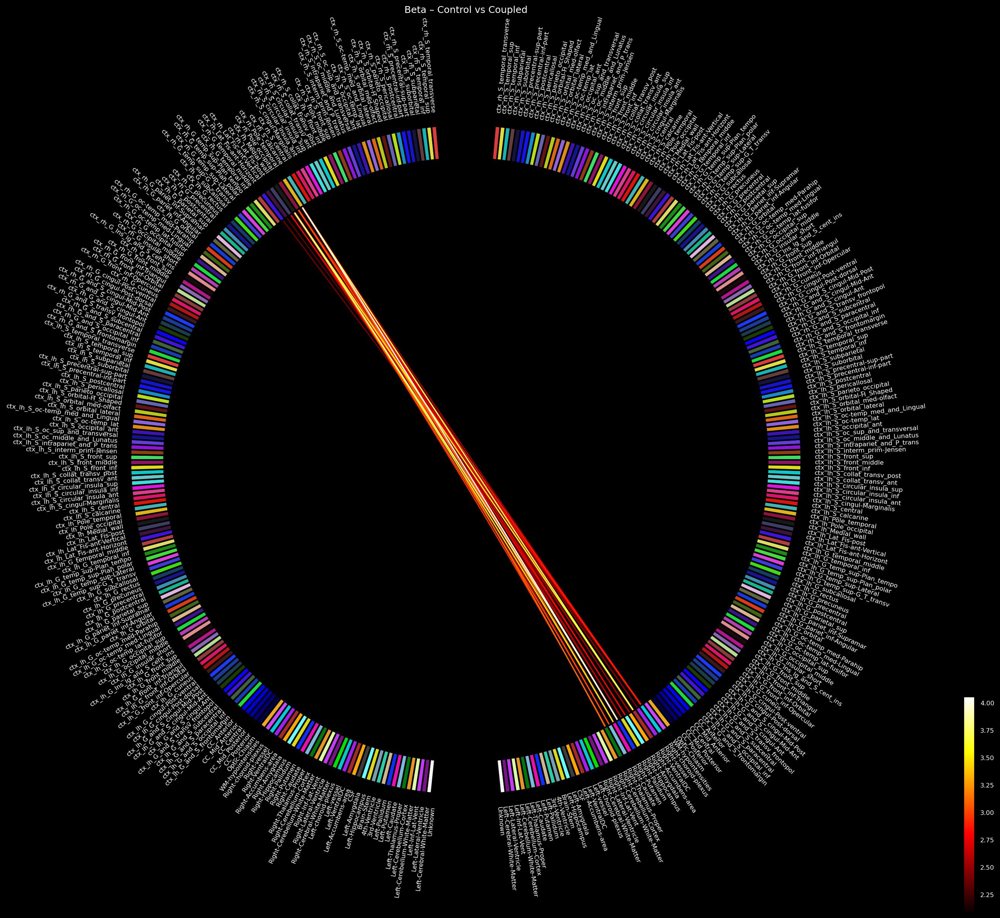

In [95]:
make_circular_plot(data = clear_data_frame(source_res_perm)[1]['beta_coupled_vs_control'],
                  title = 'Beta – Control vs Coupled',
                  n_links = 30,
                  save_fig = True)

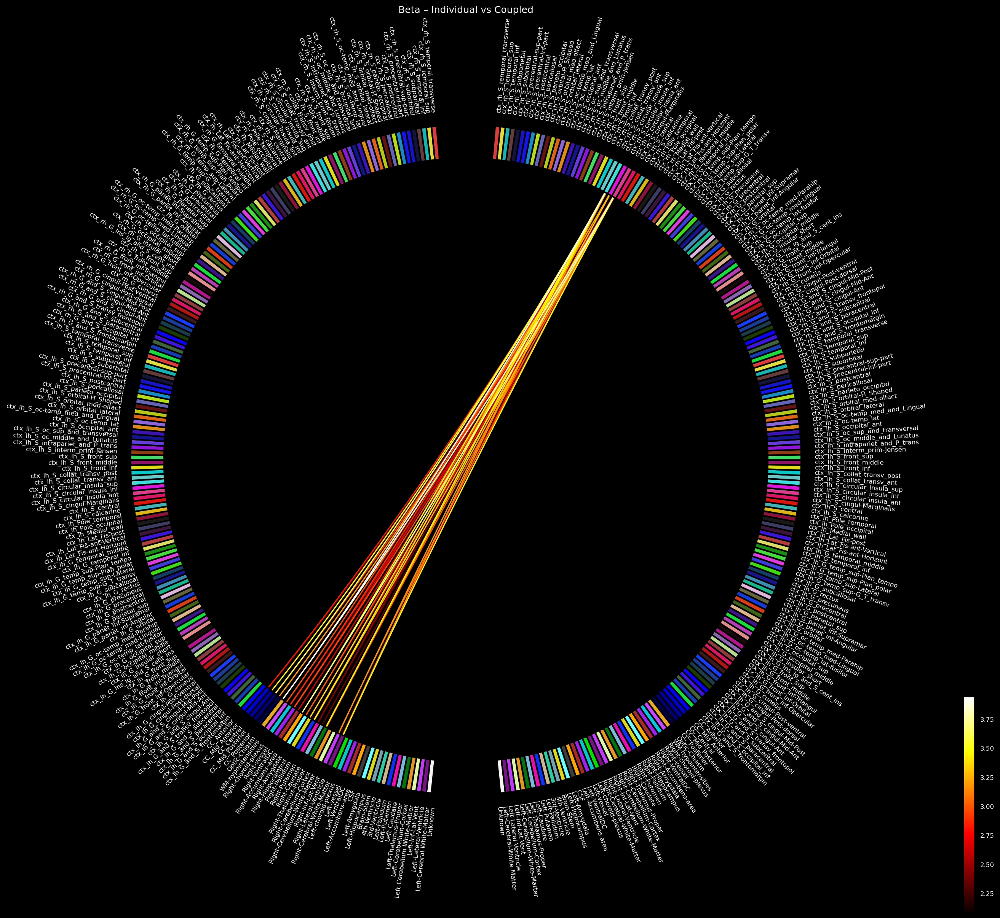

In [100]:
make_circular_plot(data = clear_data_frame(source_res_perm)[1]['beta_coupled_vs_individual'],
                  title = 'Beta – Individual vs Coupled',
                  n_links = 40,
                  save_fig = True)

## 4. Working on the Asymmetric Conditions

In [2]:
### Loading pre-computed and/or standard files

# Download fsaverage files
fs_dir = fetch_fsaverage(verbose=True)
subjects_dir = op.dirname(fs_dir)

# The files live in:
subject = 'fsaverage'
trans = 'fsaverage'  # MNE has a built-in fsaverage transformation
trans_new = 'sample_new2-trans.fif' # But I adjusted electrode positions a bit
bem = op.join(fs_dir, 'bem', 'fsaverage-5120-5120-5120-bem-sol.fif')

# Reading forward solution
fwd_fname = 'eeg_new_fwd.fif'
forward = mne.read_forward_solution(fwd_fname)
src = forward['src']

0 files missing from root.txt in /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data
0 files missing from bem.txt in /Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage
Reading forward solution from /Users/aliaksandrdabranau/Documents/Jupiter Notebook/Master's Thesis. Mirror Game/eeg_new_fwd.fif...
    Reading a source space...
    [done]
    1 source spaces read
    Desired named matrix (kind = 3523) not available
    Read EEG forward solution (14629 sources, 64 channels, free orientations)
    Source spaces transformed to the forward solution coordinate frame


In [3]:
### Applying the spatial filters to every participant to symmetric condition 
### & extracting label time courses
### & calculating PLV
    
# Defining variables

asym_conditions_list = ['actor-observer','leader-follower']

pairs = ["003","004","005","007","008","009","010","011","012","013","014",
         "016","017","018","019","020","022","023","024","025","027"]


mne.datasets.fetch_hcp_mmp_parcellation(subjects_dir=subjects_dir,
                                        verbose=True)

mne.datasets.fetch_aparc_sub_parcellation(subjects_dir=subjects_dir,
                                          verbose=True)

atlas_path = "/Users/aliaksandrdabranau/mne_data/MNE-fsaverage-data/fsaverage/mri/aparc.a2009s+aseg.mgz"

asym_con_result_dict = {}

In [4]:
# Defining a helping function

def extract_label_ts(short_epochs, condition, filters, atlas_path, src):
    stc = apply_lcmv_epochs(short_epochs[condition], filters, verbose=False)
    label_ts = mne.extract_label_time_course(
                stc, atlas_path, src, mode='mean', return_generator=False, verbose=False)
    label_ts_np = np.stack(label_ts, axis=0)
    return(label_ts_np)

In [5]:
# Running...

for pair_n in pairs:
    print(pair_n)
    folder = f"/Users/aliaksandrdabranau/Data/Mirror_game/pair{pair_n}"
    
    short_epochs_a = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}a_short_epo.fif'), verbose=False)
    short_epochs_b = mne.read_epochs(pathlib.Path(folder+f'/{pair_n}b_short_epo.fif'), verbose=False)
    
    filter_a = mne.beamformer.read_beamformer(pathlib.Path(folder+f'/{pair_n}_filters_a-lcmv.h5'))
    filter_b = mne.beamformer.read_beamformer(pathlib.Path(folder+f'/{pair_n}_filters_b-lcmv.h5'))
    
    for condition in asym_conditions_list:
        print(condition)
        
        if condition == 'actor-observer':
            condition_a = 'actor'
            condition_b = 'observer'
        elif condition == 'leader-follower':
            condition_a = 'leader'
            condition_b = 'follower'
        
        # Extracting label time courses
        # subject A
        subject_a_1 = extract_label_ts(short_epochs = short_epochs_a, 
                                   condition = condition_a,
                                   filters = filter_a,
                                   atlas_path = atlas_path, 
                                   src = src)

        subject_a_2 = extract_label_ts(short_epochs = short_epochs_a, 
                                   condition = condition_b,
                                   filters = filter_a,
                                   atlas_path = atlas_path, 
                                   src = src)
        subject_a = np.concatenate([subject_a_1,subject_a_2],axis=0)
    
        #subject B
        subject_b_1 = extract_label_ts(short_epochs = short_epochs_b, 
                                   condition = condition_b,
                                   filters = filter_b,
                                   atlas_path = atlas_path, 
                                   src = src)

        subject_b_2 = extract_label_ts(short_epochs = short_epochs_b, 
                                   condition = condition_a,
                                   filters = filter_b,
                                   atlas_path = atlas_path, 
                                   src = src)
        subject_b = np.concatenate([subject_b_1,subject_b_2],axis=0)
        
        # Combining the data of the two subjects into one array
        data_inter = np.asarray([subject_a, subject_b],dtype=float)

        # Calculating the complex signal with Hilbert
        freq_bands = {'Theta':[4,7.5],
                      'Alpha_Combined': [8,13],
                      'Beta':[14,30]}
        
        sampling_rate = 256
        
        complex_signal = analyses.compute_freq_bands(data_inter, sampling_rate, freq_bands)
        
        # Calculating synchrony value (PLV)
        con = analyses.compute_sync(complex_signal, mode = 'plv', epochs_average=True)
        
        asym_con_result_dict[pair_n + "_" + condition] = con
        
        # Saving the dictionary
        with open(pathlib.Path('asym_con_result_dict.pickle'),'wb') as handle:
            pickle.dump(asym_con_result_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

003
actor-observer
leader-follower
004
actor-observer
leader-follower
005
actor-observer
leader-follower
007
actor-observer
leader-follower
008
actor-observer
leader-follower
009
actor-observer
leader-follower
010
actor-observer
leader-follower
011
actor-observer
leader-follower
012
actor-observer
leader-follower
013
actor-observer
leader-follower
014
actor-observer
leader-follower
016
actor-observer
leader-follower
017
actor-observer
leader-follower
018
actor-observer
leader-follower
019
actor-observer
leader-follower
020
actor-observer
leader-follower
022
actor-observer
leader-follower
023
actor-observer
leader-follower
024
actor-observer
leader-follower
025
actor-observer
leader-follower
027
actor-observer
leader-follower


In [5]:
### Doing the permutation tests

# 1. Loading dictionaries
folder1 = "/Users/aliaksandrdabranau/Data/Mirror_game/"
with open(folder1+'con_result_dict.pickle', 'rb') as s:
    data_symmetric = pickle.load(s)
    
### Loading the dictionary with Asymmetric conditions 

with open(folder1+'asym_con_result_dict.pickle', 'rb') as a:
    data_asym = pickle.load(a)
    
### Merging two dicts

source_data_dict = data_symmetric | data_asym

In [28]:
source_data_dict['003_individual'][0][0:192,192:192*2]

array([[0.20544394, 0.21574291, 0.20967891, ..., 0.2151931 , 0.21158717,
        0.21567551],
       [0.20186053, 0.21003317, 0.20508685, ..., 0.20623079, 0.19435776,
        0.20561219],
       [0.20793876, 0.21119456, 0.21298716, ..., 0.21013005, 0.19690435,
        0.20427159],
       ...,
       [0.20584317, 0.20318965, 0.20491732, ..., 0.20035735, 0.19554603,
        0.19635396],
       [0.20316864, 0.20111884, 0.19672   , ..., 0.18431661, 0.18892385,
        0.1904469 ],
       [0.19519875, 0.1912962 , 0.18958108, ..., 0.19045875, 0.18857549,
        0.18655088]])

In [9]:
# 2. Permutting

big_source_res_perm = {}

freq_list = ['theta','alpha_combined','beta']


for freq in freq_list:
        
    # 2. Asymmetric conditions
    big_source_res_perm[f'{freq}_observation_vs_following'] = custom_permutation_test(source_data_dict,
                                                                                      freq,
                                                                                      'actor-observer',
                                                                                      'leader-follower')
    
    # 3. Observation & the rest
    big_source_res_perm[f'{freq}_observation_vs_control'] = custom_permutation_test(source_data_dict,
                                                                                      freq,
                                                                                      'actor-observer',
                                                                                      'control')
    big_source_res_perm[f'{freq}_observation_vs_individual'] = custom_permutation_test(source_data_dict,
                                                                                      freq,
                                                                                      'actor-observer',
                                                                                      'individual')
    big_source_res_perm[f'{freq}_observation_vs_coupled'] = custom_permutation_test(source_data_dict,
                                                                                      freq,
                                                                                      'actor-observer',
                                                                                      'coupled')
    
    
    # 4. Following & the rest
    big_source_res_perm[f'{freq}_following_vs_control'] = custom_permutation_test(source_data_dict,
                                                                                      freq,
                                                                                      'leader-follower',
                                                                                      'control')
    big_source_res_perm[f'{freq}_following_vs_individual'] = custom_permutation_test(source_data_dict,
                                                                                      freq,
                                                                                      'leader-follower',
                                                                                      'individual')
    big_source_res_perm[f'{freq}_following_vs_coupled'] = custom_permutation_test(source_data_dict,
                                                                                      freq,
                                                                                      'leader-follower',
                                                                                      'coupled')
    # Saving the dictionary
    with open(pathlib.Path('source_asym_permutation_result_dict.pickle'),'wb') as handle:
        pickle.dump(big_source_res_perm, handle, protocol=pickle.HIGHEST_PROTOCOL)

stat_fun(H1): min=-5.668176 max=6.033624
Running initial clustering …
Found 1276 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-5.227970 max=4.223942
Running initial clustering …
Found 921 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-5.130993 max=3.813496
Running initial clustering …
Found 1223 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-6.199741 max=6.034546
Running initial clustering …
Found 1555 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.526812 max=8.426672
Running initial clustering …
Found 1176 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.870122 max=5.218932
Running initial clustering …
Found 1119 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.681493 max=5.155761
Running initial clustering …
Found 1297 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-3.509147 max=7.561698
Running initial clustering …
Found 2012 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-5.427703 max=5.734167
Running initial clustering …
Found 2160 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.064501 max=7.261019
Running initial clustering …
Found 2185 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-5.085048 max=5.793172
Running initial clustering …
Found 1674 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.828551 max=4.632374
Running initial clustering …
Found 815 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.429512 max=4.589604
Running initial clustering …
Found 982 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-5.378648 max=5.160973
Running initial clustering …
Found 1297 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.240618 max=6.376162
Running initial clustering …
Found 1678 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.843907 max=5.863467
Running initial clustering …
Found 1926 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.912795 max=5.261278
Running initial clustering …
Found 1240 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.626207 max=7.350541
Running initial clustering …
Found 2487 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.607574 max=4.558420
Running initial clustering …
Found 1178 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-5.183937 max=5.127389
Running initial clustering …
Found 1632 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

stat_fun(H1): min=-4.621020 max=6.090281
Running initial clustering …
Found 1678 clusters


  0%|          | Permuting : 0/4999 [00:00<?,       ?it/s]

<b>Although the immediate output above shows that the number of permutations is 0, the saved data is correct.<br>These zeros appear after reloading the script.</b>

In [3]:
# Opening the dictionary
folder1 = "/Users/aliaksandrdabranau/Data/Mirror_game/"
with open(folder1+'source_res_perm_sym.pickle',  'rb') as a:
        source_sym = pickle.load(a)
        
with open(folder1+'source_asym_permutation_result_dict.pickle',  'rb') as s:
        source_asym = pickle.load(s)

source_permutation = source_sym | source_asym

In [32]:
source_permutation['theta_coupled_vs_control'][0].shape

(192, 192)

In [27]:
clear_data_frame(source_permutation)[0].replace('alpha_combined','alpha')

,Key,Condition_1,Condition_2,Frequency,N_signif._clusters,Signs,Indices
0,beta_coupled_vs_control,coupled,control,beta,2,"[negative, negative]","[400, 425]"
1,beta_coupled_vs_individual,coupled,individual,beta,7,"[negative, negative, negative, negative, negat...","[196, 332, 335, 1548, 1551, 1761, 1948]"
2,theta_following_vs_individual,following,individual,theta,1,[negative],[494]
3,alpha_combined_observation_vs_following,observation,following,alpha,3,"[positive, positive, positive]","[231, 275, 1117]"
4,alpha_combined_observation_vs_control,observation,control,alpha,4,"[positive, positive, positive, positive]","[91, 100, 125, 256]"
5,alpha_combined_observation_vs_individual,observation,individual,alpha,1,[positive],[60]
6,beta_observation_vs_coupled,observation,coupled,beta,26,"[positive, positive, positive, positive, posit...","[26, 31, 67, 110, 131, 142, 162, 252, 294, 299..."
7,beta_following_vs_coupled,following,coupled,beta,9,"[positive, positive, positive, positive, posit...","[149, 150, 166, 683, 831, 1006, 1064, 1158, 1292]"


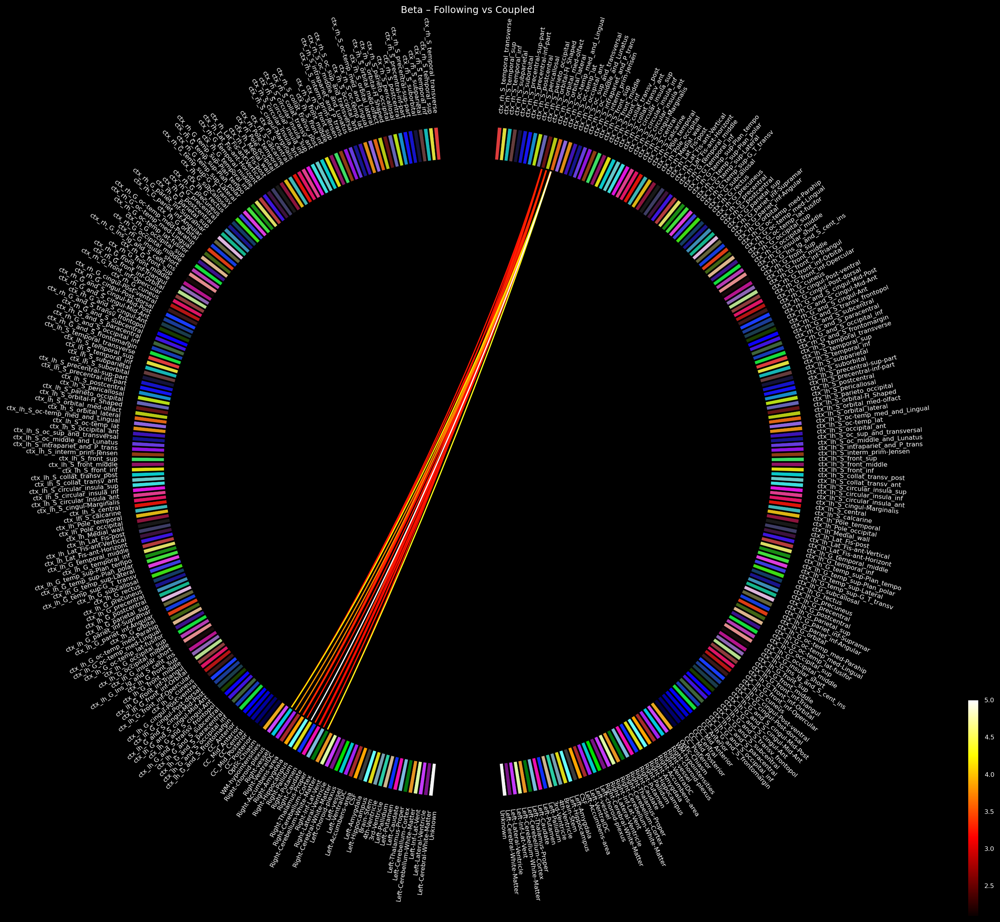

In [28]:
make_circular_plot(data = clear_data_frame(source_permutation)[1]['beta_following_vs_coupled'],
                  title = 'Beta – Following vs Coupled',
                  n_links = 20,
                  save_fig = True)

In [26]:
import mne

Brain = mne.viz.get_brain_class()

subjects_dir = mne.datasets.sample.data_path() / "subjects"
mne.datasets.fetch_hcp_mmp_parcellation(subjects_dir=subjects_dir, verbose=True)

mne.datasets.fetch_aparc_sub_parcellation(subjects_dir=subjects_dir, verbose=True)

labels = mne.read_labels_from_annot(
    "fsaverage", "aparc.a2009s", "lh", subjects_dir=subjects_dir
)

brain = Brain(
    "fsaverage",
    "lh",
    "white",
    subjects_dir=subjects_dir,
    cortex="low_contrast",
    background="black",
    size=(800, 600),
)
brain.add_annotation("aparc.a2009s", borders = False)
#aud_label = [label for label in labels if label.name == "L_A1_ROI-lh"][0]
#brain.add_label(aud_label, borders=False)

Reading labels from parcellation...
   read 75 labels from /Users/aliaksandrdabranau/mne_data/MNE-sample-data/subjects/fsaverage/label/lh.aparc.a2009s.annot
